In [1]:
# Dependencies

In [1]:
# Imports

import torch
import torch.nn as nn
import torchaudio
import torchvision
import torchaudio.transforms as aT
import torchvision.transforms as vT
from torchvision.transforms import Grayscale
import torchvision.transforms.functional as vF

from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Audio
import librosa
import librosa.display
import os

from PIL import Image

print(f'PyTorch {torch.__version__} --- tested on 1.9.0') 
print(f'torchvision {torchvision.__version__} --- tested on 0.10.0')
print(f'torchaudio {torchaudio.__version__} --- tested on 0.9.0a0+33b2469')


PyTorch 1.9.0 --- tested on 1.9.0
torchvision 0.10.0 --- tested on 0.10.0
torchaudio 0.9.0a0+33b2469 --- tested on 0.9.0a0+33b2469


In [2]:
# Helper functions

import random

def set_seed(seed=None, seed_torch=True):
  if seed is None:
    seed = np.random.choice(2 ** 32)
  random.seed(seed)
  np.random.seed(seed)
  if seed_torch:
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

  print(f'Random seed {seed} has been set.')


# In case that `DataLoader` is used
def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

def set_device():
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
    print("WARNING: For this notebook to perform best, "
        "if possible, in the menu under `Runtime` -> "
        "`Change runtime type.`  select `GPU` ")
  else:
    print("GPU is enabled in this notebook.")

  return device


try:
    from tkinter import Tk
    from tkFileDialog import askopenfilenames
except:
    from tkinter import Tk
    from tkinter import filedialog

def choose_file():
    Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
    filenames = filedialog.askopenfilenames() # show an "Open" dialog box and return the path to the selected file
    return filenames[0]

import matplotlib.image as im

def choose_image(as_numpy=True):
    path = choose_file()
    img = Image.open(path)
    
    if as_numpy:
        img = np.asarray(img)
        img = img[:,:,:3] # PNGs often have an alpha channel, remove it

    print("Image loaded from: ", path)
    return img

set_seed(2021)
DEVICE = set_device()


    


Random seed 2021 has been set.
GPU is enabled in this notebook.


In [71]:
# Helper Functions for Data Understanding

def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()
  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def stat_img(img, origin='upper', gray=False, id=None):
    if id is None:
        id = "Image"
    if type(img) == Image.Image:
        img = np.array(img)
    
    print(f"{id}:  {type(img)} of shape {img.shape} and dtype {img.dtype}")
    print(f"{id}:  max value: {img.max()}  min value: {img.min()}")
    print(f"{id}:  mean: {img.mean():.6f}  std: {img.std():.6f}")
    plt.axis('off')
    if gray:
        plt.imshow(img, origin=origin, cmap='gray')
    else:
        plt.imshow(img, origin=origin)
    plt.show()    

def minmax_norm(arr):
    if type(arr) == torch.Tensor:
        maxi = arr.max().item()
        mini = arr.min().item()
    else: # assume it's a numpy array
        maxi = arr.max()
        mini = arr.min()
        
    return (arr - mini) / (maxi-mini), mini, maxi

def minmax_norm_invert(arr, minimum, maximum):
    return arr * (maximum-minimum) + minimum

def invert_minmax_log_norm(arr, mini, maxi):
    return np.exp(minmax_norm_invert(arr, mini, maxi))-1


def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None, todb=False):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  if todb:
    spec = librosa.power_to_db(spec)
  im = axs.imshow(spec, origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def play_audio(waveform, samplerate):
  if type(waveform) == torch.Tensor:
      waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(data=waveform, rate=samplerate))
  elif num_channels == 2:
    display(Audio(data=(waveform[0], waveform[1]), rate=samplerate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def stft2wav(spec, n_fft=1024, hop_length=256, sample_rate=22050, win_length=None, plot_wave=False, show_player=True):
    if type(spec) == Image.Image:
        spec = np.array(spec)
    
    resynth_griffin_lim = aT.GriffinLim(
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
    )
    print(f"Input image shape {spec.shape}")
    if len(spec.shape) == 2:
        spec = np.expand_dims(spec, 2)
    synthesized_waveform = resynth_griffin_lim(torch.from_numpy(spec).permute(2, 0, 1))
    if plot_wave:
        plot_waveform(synthesized_waveform, sample_rate, title="Synthesized Waveform from STFT")
    if show_player:
        play_audio(synthesized_waveform, sample_rate)
    return synthesized_waveform

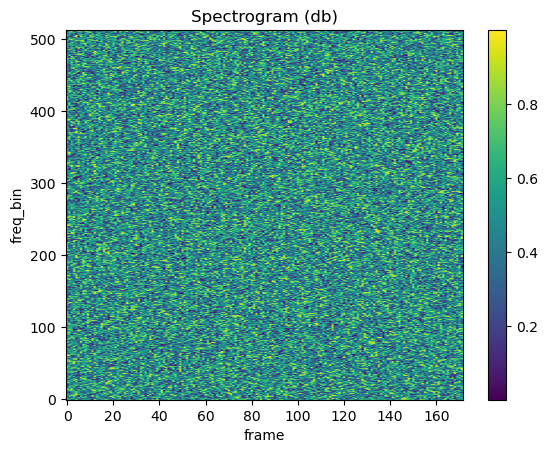

(513, 172, 1) <class 'numpy.ndarray'>
Input image shape (513, 172, 1)


In [5]:
sample_rate = 22050
n_fft = 1024
hop_length = 256
num_bins = int(n_fft / 2) + 1
num_frames = int(sample_rate / hop_length)


# Generate Artificial Spectrograms

# Uniform Noise
img_noise = np.random.rand(num_bins, num_frames * 2 , 1)
plot_spectrogram(img_noise)
print(img_noise.shape, type(img_noise))
waveform = stft2wav(img_noise)

Image loaded from:  /home/jon/Drive/LEVERHULME/COURSES/NEUROMATCH2021/HallucinatingGANs/Code/data/inputs/grid_90.png
<class 'numpy.ndarray'> (513, 1470)


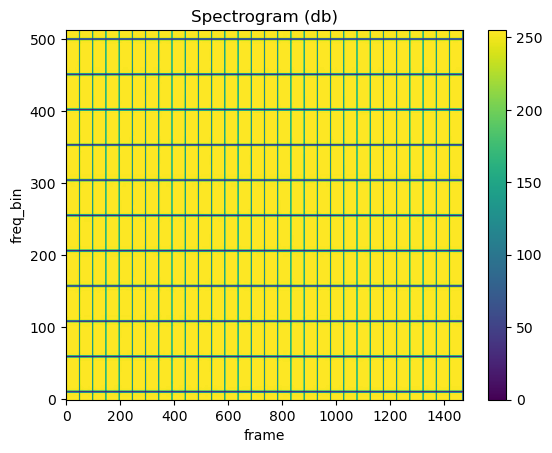

(513, 1470) <class 'numpy.ndarray'>
Input image shape (513, 1470)


In [6]:
# An arbitrary image
img = choose_image()
#img = clip_image(img, y=513, mode='center')

left = 0
right = img.shape[1]
height = 513
top = int((img.shape[0] - height) / 2)
bottom = img.shape[0] - top

# Do processing - torchvision uses PIL internally for image manipulations
img = Image.fromarray(img) # convert nparray to PIL so we can use torchaudio transforms directly

graycrop = vT.Compose([vT.Grayscale(1), vT.CenterCrop([513, right])])
img = graycrop(img)

img = np.asarray(img) # convert back to numpy

print(type(img), img.shape)

plot_spectrogram(img)
print(img.shape, type(img))
waveform = stft2wav(img)


In [ ]:
# Generated Patterns

In [7]:
# Load gztan
gztan = torchaudio.datasets.GTZAN(os.path.abspath('./data'), download=False)

torch.Size([661794])
CLIPPED STFT
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max value: 1.0  min value: 4.0467629247586956e-14
Image:  mean: 0.232117  std: 0.359889


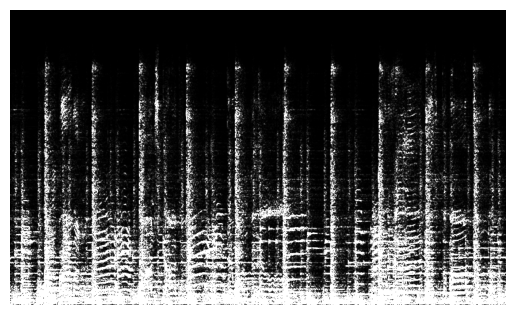

Input image shape torch.Size([513, 862])


LOG STFT
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max value: 9.285219192504883  min value: 0.0
Image:  mean: 0.395109  std: 0.947945


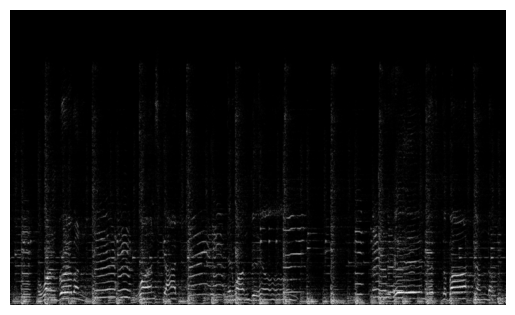

invert log and reconstruct...
Input image shape torch.Size([513, 862])


Minmax Norm of Log
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.042552  std: 0.102092


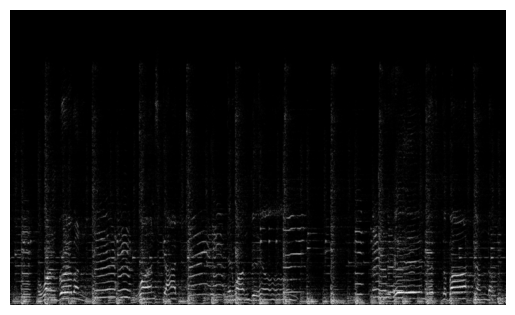

invert minmax & log and reconstruct...
Input image shape torch.Size([513, 862])


Unmodified STFT
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max value: 10776.5302734375  min value: 4.0467629247586956e-14
Image:  mean: 7.150015  std: 93.831581


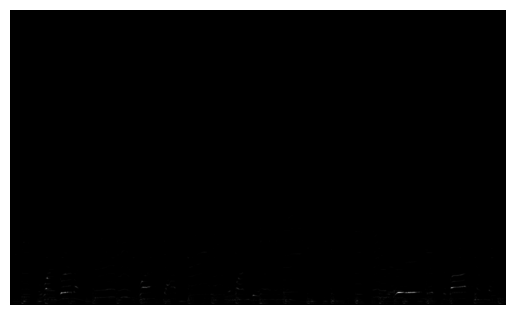

Input image shape torch.Size([513, 862])


tensor([[-0.0196, -0.0275, -0.0433,  ..., -0.1771, -0.1778, -0.1717]])

In [75]:
# A wavefile from GZTAN
waveform, sr, label = gztan[0]
num_chan, num_frames = waveform.shape
waveform = waveform.squeeze() # remove the channel dimension
print(waveform.shape)
waveform = waveform[:sr*10] # take first 10 seconds

n_fft = 1024
n_mels = 128
win_length = None
hop_length = 256 # smaller hop size leads to better reconstruction but takes longer to compute
power = 2.0 # squared power magnitude spectrogram

get_stft = torchaudio.transforms.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=power,
)
#amp_to_db = torchaudio.transforms.AmplitudeToDB('power')

stft = get_stft(waveform)
#stft_db = amp_to_db(stft)

#stft_tensor = torch.tensor(stft).reshape(3, 513, -1)
#stat_img(stft_tensor.clip(0,1).permute(1,2,0))


# TODO: Different ways of normalizing an amplitude spectrogram to pixels between 0.0-1.0

# very crude method that still preserves structure < 1.0 --- ok for visualization but terrible for reconstruction!
print("CLIPPED STFT")
stft_clipped = stft.clip(0.0, 1.0)
stat_img(stft_clipped, origin='lower', gray=True)
stft2wav(stft_clipped)


print("LOG STFT")
stft_log = np.log(stft+1)
stat_img(stft_log, origin='lower', gray=True)
print("invert log and reconstruct...")
stft2wav(np.exp(stft_log)-1)


# (This is probably the best transformation to use while retaining the most valuable visual information...
print("Minmax Norm of Log")
# NOTE: you must store the maximum and minimum in order to do a reconstruction!
stft_minmax, mini, maxi = minmax_norm(stft_log)
stat_img(stft_minmax, origin='lower', gray=True)
print("invert minmax & log and reconstruct...")
stft2wav(invert_minmax_log_norm(stft_minmax, mini, maxi))

# Unmodified STFT
print("Unmodified STFT")
stat_img(stft, origin='lower', gray=True)
stft2wav(stft)



Original
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.041244  std: 0.101829


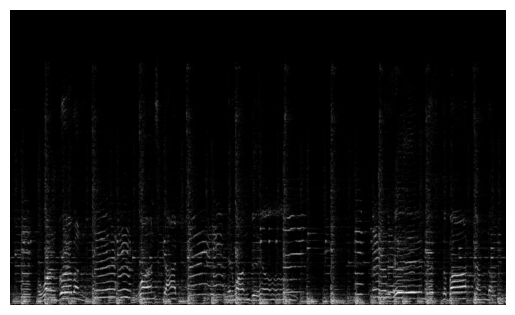

Input image shape (513, 862)


Time Shuffle Image
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.041244  std: 0.101829


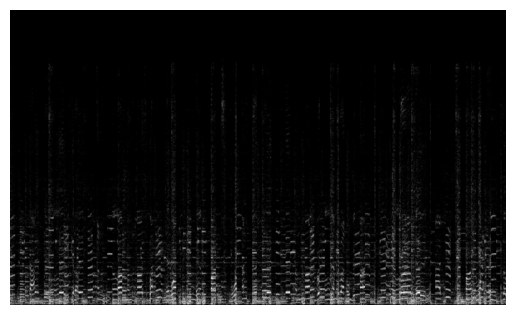

Input image shape (513, 862)


Frequency Shuffle Image
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.041244  std: 0.101829


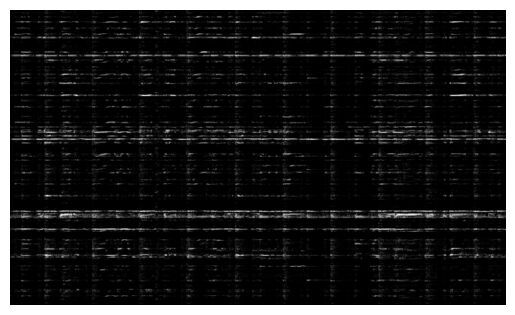

Input image shape (513, 862)


Translate Image
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.041244  std: 0.101829


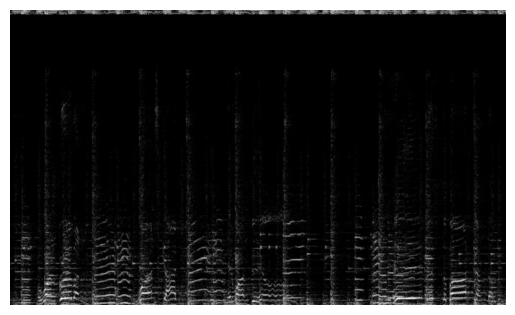

Invertminmax log norm blur
Input image shape (513, 862)


<class 'PIL.ImageEnhance.Sharpness'>
Sharpened x20.0
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.097814  std: 0.244646


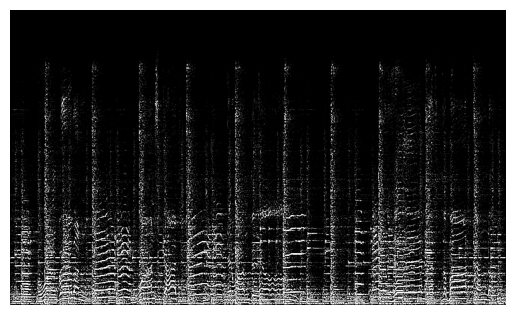

Input image shape (513, 862)


<class 'PIL.ImageEnhance.Contrast'>
Contrast x5
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.105663  std: 0.267989


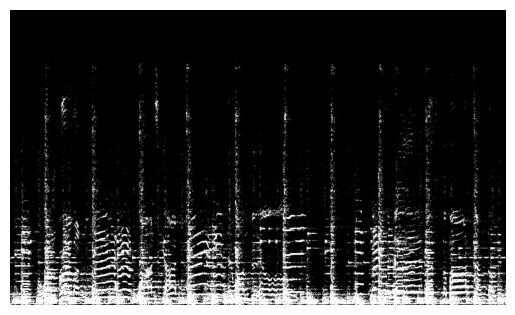

Input image shape (513, 862)


Gaussian Blur strength 3
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 0.5450980392156862  min value: 0.0
Image:  mean: 0.040948  std: 0.079232


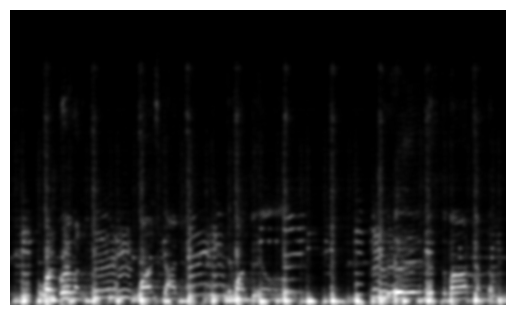

Invertminmax log norm blur
Input image shape (513, 862)


Contour Filter
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.059965  std: 0.170065


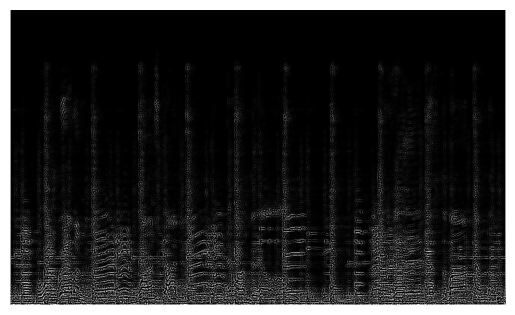

Invertminmax log norm blur
Input image shape (513, 862)


tensor([[-2.9748, -6.6511,  2.3712,  ...,  1.1547, -1.7815,  1.2520]],
       dtype=torch.float64)

In [139]:
from PIL import ImageEnhance, ImageFilter

# Applying image manipulations to spectrograms....
img = vF.to_pil_image(stft_minmax)
print("Original")
stat_img(np.array(img)/255.0, origin='lower', gray=True)
stft2wav(invert_minmax_log_norm(np.array(img)/255.0, mini, maxi))




ts_img = np.array(img)/255.0
print("Time Shuffle Image")
ts_segments = np.array_split(ts_img, 100, axis=1)
np.random.shuffle(ts_segments)
ts_img = np.concatenate(ts_segments, axis=1)
stat_img(ts_img, origin='lower', gray=True)
ts_img = invert_minmax_log_norm(ts_img, mini, maxi)
stft2wav(ts_img)


fs_img = np.array(img)/255.0
print("Frequency Shuffle Image")
fs_segments = np.array_split(fs_img, 200, axis=0)
np.random.shuffle(fs_segments)
fs_img = np.concatenate(fs_segments, axis=0)
stat_img(fs_img, origin='lower', gray=True)
fs_img = invert_minmax_log_norm(fs_img, mini, maxi)
stft2wav(fs_img)



tr_img = np.array(img)/255.0
print("Translate Image")
tr_img = np.roll(tr_img, -10, axis=0)
stat_img(tr_img, origin='lower', gray=True)
tr_img = invert_minmax_log_norm(tr_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(tr_img)



sharp = ImageEnhance.Sharpness(img)
print(type(sharp))
sharp_img = sharp.enhance(20.0)
print("Sharpened x20.0")
sharp_img = np.array(sharp_img)/255.0
stat_img(sharp_img, origin='lower', gray=True)
stft2wav(invert_minmax_log_norm(sharp_img, mini, maxi))

cont = ImageEnhance.Contrast(img)
print(type(cont))
cont_img = cont.enhance(5)
print("Contrast x5")
cont_img = np.array(cont_img)/255.0
stat_img(cont_img, origin='lower', gray=True)
stft2wav(invert_minmax_log_norm(cont_img, mini, maxi))

blur_img = img.filter(ImageFilter.GaussianBlur(3))
print("Gaussian Blur strength 3")
blur_img = np.array(blur_img)/255.0
stat_img(blur_img, origin='lower', gray=True)
blur_img = invert_minmax_log_norm(blur_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(blur_img)


ctr_img = img.filter(ImageFilter.CONTOUR)
print("Contour Filter")
ctr_img = (255.0-np.array(ctr_img))/255.0
stat_img(ctr_img, origin='lower', gray=True)
ctr_img = invert_minmax_log_norm(ctr_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(ctr_img)






0.0 1.0
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.001673  std: 0.040873


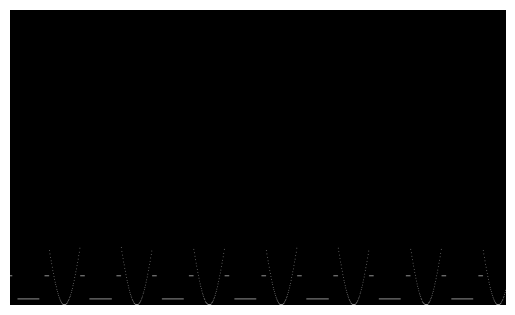

Input image shape (513, 862)


Gaussian Blur strength 3
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 0.17647058823529413  min value: 0.0
Image:  mean: 0.001718  std: 0.008140


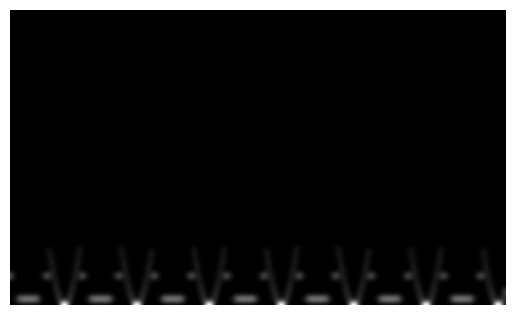

Invertminmax log norm blur
Input image shape (513, 862)


Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 1.0  min value: 0.0
Image:  mean: 0.013645  std: 0.116013


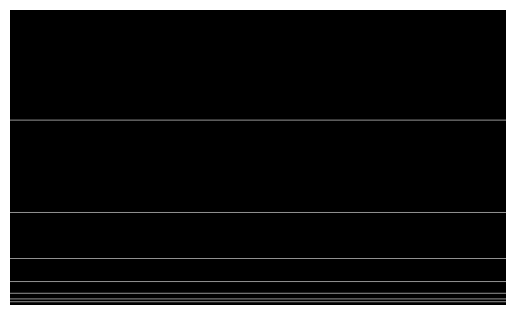

Input image shape (513, 862)


Gaussian Blur strength 3
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max value: 0.18823529411764706  min value: 0.0
Image:  mean: 0.013592  std: 0.035826


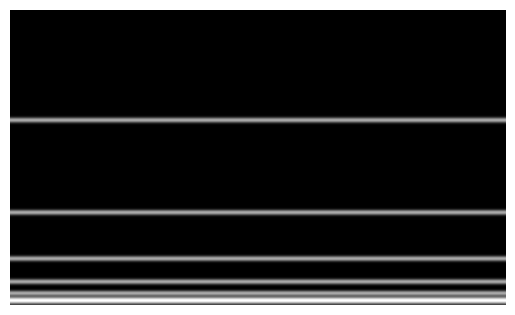

Invertminmax log norm blur
Input image shape (513, 862)


tensor([[-0.0139, -0.0010,  0.0093,  ...,  0.0052,  0.0109,  0.0207]],
       dtype=torch.float64)

In [194]:
# Generate Test Input Images


# Sinusoidal Pattern
sinus_img = np.zeros((513, 862))
for i in np.arange(0, 862):
    idx = int(255*((np.sin(i * 0.05) + 1)/2))
    if idx < 100:
        sinus_img[idx, i] = 1.0
    elif idx < 150:
        sinus_img[50, i] = 1.0 
    elif idx > 200:
        sinus_img[10, i] = 1.0
print(sinus_img.min(), sinus_img.max())
#sinus_img = vF.to_pil_image(sinus_img)
#print("Sinus")
stat_img(sinus_img, origin='lower', gray=True)
stft2wav(sinus_img)

blur_img = vF.to_pil_image(torch.tensor(sinus_img))
blur_img = blur_img.filter(ImageFilter.GaussianBlur(5))
print("Gaussian Blur strength 3")
blur_img = np.array(blur_img)/255.0
stat_img(blur_img, origin='lower', gray=True)
blur_img = invert_minmax_log_norm(blur_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(blur_img)


# Octaves
tone_img = np.zeros((513, 862))
for i in np.arange(0, 862):
    tone_img[320, i] = 1.0
    tone_img[160, i] = 1.0
    tone_img[80, i] = 1.0
    tone_img[40, i] = 1.0
    tone_img[20, i] = 1.0
    tone_img[10, i] = 1.0 
    tone_img[5, i] = 1.0
stat_img(tone_img, origin='lower', gray=True)
stft2wav(tone_img)

blur_img = vF.to_pil_image(torch.tensor(tone_img))
blur_img = blur_img.filter(ImageFilter.GaussianBlur(3))
print("Gaussian Blur strength 3")
blur_img = np.array(blur_img)/255.0
stat_img(blur_img, origin='lower', gray=True)
blur_img = invert_minmax_log_norm(blur_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(blur_img)



# Horizontal line fragments

# Stacked Horizontal line fragments